# Czynniki wpływajace na cene nieruchomosci

Katarzyna Jałbrzykowska 220763

Praca przygotowana w ramach przedmiotu <i>Przetwarzanie i analiza danych w języku Python</i>

In [1]:
#Zaimportowanie bibliotek
import pandas as pd
import numpy as np
import seaborn as sn
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import math
import geopandas as gpd
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from statsmodels.graphics.gofplots import ProbPlot
import statsmodels.formula.api as smf
import statsmodels.api as sm


Kupno lub sprzedaż domu jest jednym z najważniejszych wydarzeń w dorosłym życiu. Przy wyborze odpowiedniej nieruchomości sugerujemy się nie tylko jej rozmiarem, ale także lokalizacją, dostępnym transportem, standardem wykończenia, a nawet oceną okolicy. Poniższa praca ma na celu zbadanie rynku nieruchomości w Warszawie oraz w jej okolicach. Szczegółowa wycena czynników wpływających na cenę domów podwarszawskich, pozwoli na zidentyfikowanie najważniejszych czynników, na które kupujący oraz sprzedający zwracają największą uwagę przy wycenie posiadłości.

In [2]:
#czytanie zbioru danych
realestate = pd.read_csv('dane.csv', index_col = 0, header = 0, decimal = ',', sep = ';')
#Wymiary tabeli
print(realestate.shape)
#Nagłówek tabeli
realestate.head()

(738, 15)


,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs
ID,,,,,,,,,,,,,,,
1,1200.0,147.0,5.0,1,2.0,580,2014,6,55,35,2231.4,24.9,60.875526,3.0,Ząbki
2,625.0,127.0,6.0,2,3.0,130,2021,-1,55,45,2231.4,24.9,60.875526,NaN,Ząbki
3,1000.0,104.0,4.0,1,2.0,977,1960,60,55,46,2231.4,24.9,60.875526,2.0,Ząbki
4,1300.0,167.0,6.0,1,2.0,783,2010,10,50,46,2231.4,24.9,60.875526,2.0,Ząbki
5,2700.0,690.0,15.0,2,5.0,1200,1998,22,55,49,2231.4,24.9,60.875526,3.0,Ząbki


Wczytany zbiór danych składał się z 738 obserwacji oraz 15 kolumn opisujących charakterystyki poszczególnych nieruchomości. 

Przeanalizujmy, właściwości zaimportowanego zbioru, w szczgólności typ danych poszczególnych kolumn.

In [3]:
# Typy danych oraz brakujące informacje
realestate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 738 entries, 1 to 740
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Price    738 non-null    float64
 1   Area     738 non-null    float64
 2   Rooms    737 non-null    float64
 3   Flrs     738 non-null    int64  
 4   Baths    735 non-null    float64
 5   Land     738 non-null    object 
 6   YearB    738 non-null    object 
 7   Age      738 non-null    object 
 8   Auto     738 non-null    int64  
 9   Public   738 non-null    int64  
 10  Inc      738 non-null    float64
 11  PM2_5    738 non-null    float64
 12  Edu      738 non-null    float64
 13  Condtn   657 non-null    float64
 14  Subbrbs  738 non-null    object 
dtypes: float64(8), int64(3), object(4)
memory usage: 92.2+ KB


Przeanalizujmy ponadto podstawowe statystyki opisowe danych.

In [4]:
#statystyki opisowe dla poszczególnych kolumn
realestate.describe().T

,count,mean,std,min,25%,50%,75%,max
Price,738.0,1999.284759,1643.723693,448.000000,990.000000,1590.00000,2497.999250,19500.000000
Area,738.0,279.581762,148.341086,65.000000,180.000000,248.00000,340.000000,1465.000000
Rooms,737.0,6.145183,2.003891,2.000000,5.000000,6.00000,7.000000,24.000000
Flrs,738.0,1.552846,0.671618,0.000000,1.000000,1.00000,2.000000,4.000000
Baths,735.0,2.639456,1.110671,1.000000,2.000000,2.00000,3.000000,9.000000
Auto,738.0,55.060976,14.317786,16.000000,45.000000,55.00000,65.000000,100.000000
Public,738.0,56.869919,20.408964,17.000000,42.000000,55.00000,70.000000,147.000000
Inc,738.0,3985.196084,882.124523,1982.130000,3499.650000,4342.56000,4342.560000,6448.750000
PM2_5,738.0,19.874390,1.975496,16.100000,18.300000,19.60000,21.300000,25.400000
Edu,738.0,64.499610,4.757261,51.042426,60.983788,64.47567,68.038545,74.022516


Przygotowanie danych do analizy wymaga zdefiniowania brakujących danych. 

<AxesSubplot:ylabel='ID'>

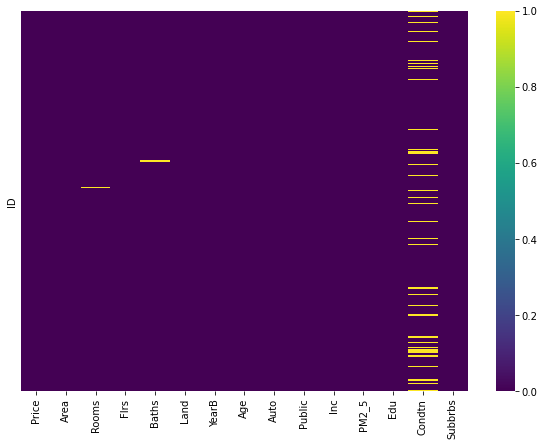

In [5]:
#wizualizacja brakujących informacji
fig, ax = plt.subplots(figsize=(10,7))
sn.heatmap(realestate.isnull(), yticklabels=False,cmap="viridis")

In [6]:
#Określenie, jaki procent stanowią brakujące informacje
round(realestate.isnull().sum()/len(realestate)*100,2)

Price       0.00
Area        0.00
Rooms       0.14
Flrs        0.00
Baths       0.41
Land        0.00
YearB       0.00
Age         0.00
Auto        0.00
Public      0.00
Inc         0.00
PM2_5       0.00
Edu         0.00
Condtn     10.98
Subbrbs     0.00
dtype: float64

Przygotowanie zbioru danych także wymaga konwersji kolumn liczbowych na odpowiedni typ danych.
Wyswietlenie unikalnych pozycji w analizowanych kolumnach ułatwi znalezienie przyczyny błędnej konwersji.

In [7]:
#Unikalne pozycje kolumny "Land"
realestate['Land'].unique()

array(['580', '130', '977', '783', '1200', '456', '374', '600', '283',
       '1001', '500', '83', 'BRAK', '1050', '1211', '367', '505', '370',
       '1061', '712', '1133', '144', '553', '550', '650', '668', '390',
       '990', '665', '2500', '1530', '333', '1300', '640', '700', '926',
       '611', '350', '530', '900', '736', '1152', '200', '1346', '398',
       '792', '570', '543', '670', '635', '568', '683', '677', '654',
       '1659', '1120', '410', '1000', '51200', '473', '2376', '760',
       '445', '1500', '3908', '916', '1502', '590', '95', '679', '666',
       '36', '575', '1276', '722', '1215', '633', '1879', '1250', '2419',
       '2000', '540', '2393', '3700', '1030', '2850', '2162', '1800',
       '2144', '3410', '1805', '1967', '1520', '935', '2011', '569',
       '800', '820', '586', '710', '645', '1850', '379', '9268', '2798',
       '720', '1065', '2100', '1046', '847', '515', '2250', '2870',
       '1701', '925', '869', '2555', '2130', '3300', '1154', '603',
      

Oprócz wartości liczbowych w kolumnie możemy zauważyć pozycję "BRAK", a także format liczbowy z uzyciem ",".

Czyszczenie zbioru danych zaczniemy od usunięcia wierszy z niepełną informacją.

In [8]:
#Zliczenie wierszy z pustymi informacjami
realestate.isnull().sum()

Price       0
Area        0
Rooms       1
Flrs        0
Baths       3
Land        0
YearB       0
Age         0
Auto        0
Public      0
Inc         0
PM2_5       0
Edu         0
Condtn     81
Subbrbs     0
dtype: int64

In [9]:
#Usunięcie wierszy z pustymi informacjami
realestate2=realestate.dropna()
realestate2.isnull().sum()

Price      0
Area       0
Rooms      0
Flrs       0
Baths      0
Land       0
YearB      0
Age        0
Auto       0
Public     0
Inc        0
PM2_5      0
Edu        0
Condtn     0
Subbrbs    0
dtype: int64

In [10]:
realestate2.shape

(653, 15)

Po usunięciu braków zbiór danych zawiera 653 obserwacje.

In [11]:
#Usuwam wiersze zawierające wyrażenie "BRAK"
realestate2 = realestate2[(realestate2['YearB'] != 'BRAK') & (realestate2['Land'] != 'BRAK') & (realestate2['Age'] != 'BRAK')]

In [12]:
#zamieniam przecinki na kropki, aby otrzymać poprawny format liczbowy
realestate2['Land']=realestate2['Land'].map(lambda x: x.replace(",","."))
realestate2['Land'].unique()

array(['580', '977', '783', '1200', '456', '374', '600', '283', '1001',
       '1050', '1211', '367', '505', '370', '1061', '712', '1133', '144',
       '553', '550', '650', '668', '390', '990', '665', '2500', '1530',
       '333', '1300', '640', '700', '926', '611', '530', '900', '736',
       '1152', '200', '1346', '398', '792', '570', '543', '670', '635',
       '568', '683', '677', '654', '1659', '1120', '1000', '51200', '473',
       '2376', '760', '445', '1500', '3908', '916', '1502', '590', '95',
       '679', '666', '575', '722', '1215', '633', '1879', '1250', '2419',
       '2000', '540', '2393', '3700', '1030', '2850', '2162', '1800',
       '2144', '1805', '1967', '1520', '935', '2011', '569', '800', '820',
       '710', '379', '9268', '2798', '720', '1065', '2100', '1046', '847',
       '515', '2250', '2870', '1701', '925', '869', '2555', '2130',
       '3300', '1154', '603', '2800', '3000', '1100', '4065', '690',
       '4500', '3339', '3646', '966', '300', '7394', '500', 

In [13]:
#zamieniam typ z object na float oraz integer
realestate2[['YearB','Land','Age']] = realestate2[['YearB','Land','Age']].apply(pd.to_numeric, errors="coerce").copy()
realestate2[['Condtn','Baths','Rooms']] = realestate2[['Condtn','Baths','Rooms']].astype('int64')

In [14]:
print(realestate2.shape)
#Sprawdzenie typów danych
realestate2.dtypes

(649, 15)


Price      float64
Area       float64
Rooms        int64
Flrs         int64
Baths        int64
Land       float64
YearB        int64
Age          int64
Auto         int64
Public       int64
Inc        float64
PM2_5      float64
Edu        float64
Condtn       int64
Subbrbs     object
dtype: object

In [15]:
#Obejrzenie pierwszych wierszy tabeli
realestate2.head()

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs
ID,,,,,,,,,,,,,,,
1,1200.0,147.0,5,1,2,580.0,2014,6,55,35,2231.4,24.9,60.875526,3,Ząbki
3,1000.0,104.0,4,1,2,977.0,1960,60,55,46,2231.4,24.9,60.875526,2,Ząbki
4,1300.0,167.0,6,1,2,783.0,2010,10,50,46,2231.4,24.9,60.875526,2,Ząbki
5,2700.0,690.0,15,2,5,1200.0,1998,22,55,49,2231.4,24.9,60.875526,3,Ząbki
6,499.0,136.0,4,0,1,456.0,1970,50,55,43,2231.4,24.9,60.875526,1,Ząbki


Chcemy, aby nasza analiza opierała się na zbiorze danych o jednolitych charakterystykach, zatem usunięte zostaną obserwacje, dla których zmienna Land przyjmuje wartości większe niż 10 000 m2, czyli nieruchomości które mogą mieć status działki rolnej.

In [16]:
#usuwam powierzchnie dzialki > 10000
realestate2.drop(realestate2[realestate2.Land>=10000].index, inplace=True)

Dodatkowo usuniete zostana obserwację zbudowane przed 1945 rokiem (domy zabytkowe), a także oddane w ciagu ostatniego roku, często wykonńczone w stanie deweloperskim.

In [17]:
# usuwam lata budowy <=1945 oraz >= 2020)
realestate2.drop(realestate2[(realestate2.YearB>=2020) | (realestate2.YearB<=1945)].index, inplace=True)

In [18]:
realestate2.shape

(627, 15)

Obserwacje posiadające zerową liczbe pięter zostaną zamienione na domy parterowe.

In [19]:
#przyjmujemy zerowa liczbe pieter, jako domy parterowe
realestate2['Flrs'] = realestate2.Flrs.apply(lambda x: 1 if x ==0 else x)

Do analizy konieczne jest dodanie nowej kolumny obliczającej cene m2 - PriceM2 każdej nieruchomości. 
Dodatkowo policzona zostanie w kolumnie RoomsS średnia wielkość pokoju.

In [20]:
#Dodanie nowej kolummy - cena m2
realestate2["PriceM2"] = realestate2.apply(lambda x: x['Price']/x['Area'], axis = 1)

In [21]:
#Dodanie nowej kolummy - średnie powierzchnia pokoju
realestate2["RoomsS"] = realestate2.apply(lambda x: x['Area']/x['Rooms'], axis = 1)

In [22]:
#Podsumowanie zbioru danych
realestate2.describe().round(decimals=2)

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,PriceM2,RoomsS
count,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00,627.00
mean,2002.26,286.77,6.22,1.55,2.65,1100.96,1999.66,20.34,55.27,56.81,3981.88,19.86,64.58,2.81,7.05,46.08
std,1601.37,150.47,2.01,0.65,1.13,974.86,13.64,13.64,14.20,20.24,882.44,1.97,4.83,1.07,3.26,18.64
min,448.00,65.00,2.00,1.00,1.00,80.00,1947.00,1.00,18.00,18.00,1982.13,16.10,52.82,1.00,2.03,17.00
25%,1000.00,186.25,5.00,1.00,2.00,473.00,1996.00,11.00,45.00,42.00,3499.65,18.30,60.98,2.00,4.80,34.00
50%,1600.00,257.00,6.00,1.00,2.00,900.00,2002.00,18.00,55.00,55.00,4342.56,19.60,64.48,3.00,6.31,42.67
75%,2490.00,350.00,7.00,2.00,3.00,1375.50,2009.00,24.00,65.00,70.00,4342.56,21.10,68.04,4.00,8.69,53.40
max,19500.00,1465.00,24.00,4.00,9.00,9568.00,2019.00,73.00,100.00,147.00,6448.75,25.40,74.02,5.00,22.82,183.12


Przyjrzymy się teraz obserwacjom skrajnym, w celu sprawdzenia czy nie są one błędne.

In [23]:
#obserwacje z najdłuższym oraz najkrótszym czasem dojazdu do centru.
realestate2.loc[(realestate2['Public']==147)|(realestate2['Public']==18),]

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs,PriceM2,RoomsS
ID,,,,,,,,,,,,,,,,,
416,5200.0,300.0,5,2,3,300.0,1958,62,18,18,4342.56,22.1,68.038545,4,Mokotów,17.333333,60.000000
723,999.0,100.0,3,1,1,4800.0,1960,60,55,147,3755.85,18.4,61.725296,3,Grodzisk Mazowiecki,9.990000,33.333333


In [24]:
#obserwacje zawierające największą ilość łazienek = 9
realestate2.loc[(realestate2['Baths']==9),]

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs,PriceM2,RoomsS
ID,,,,,,,,,,,,,,,,,
464,11500.0,1100.0,10,2,9,1320.0,2016,4,40,37,4342.56,19.8,70.812181,4,Wilanów,10.454545,110.000000
501,2500.0,600.0,9,2,9,1254.0,1992,28,55,47,4342.56,19.1,71.374312,2,Wesoła,4.166667,66.666667


In [25]:
#obserwacje gdzie średnia powierzchnia pokoju jest większa od 99
realestate2.loc[realestate2['RoomsS']>99,].sort_values(by='RoomsS', ascending=False)

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs,PriceM2,RoomsS
ID,,,,,,,,,,,,,,,,,
695,13900.0,1465.0,8,1,4,6140.0,2008,12,55,65,3920.47,18.4,58.718906,5,Łomianki,9.488055,183.125000
670,4980.0,510.0,3,1,2,1222.0,2010,10,45,37,4342.56,21.3,66.462333,4,Bielany,9.764706,170.000000
321,1999.0,600.0,4,1,2,4364.0,2015,5,55,63,3499.65,18.6,58.464816,1,Brwinów,3.331667,150.000000
482,8900.0,1098.0,9,1,3,2700.0,2000,20,45,42,4342.56,20.5,73.513130,4,Ursynów,8.105647,122.000000
249,3500.0,584.4,5,3,3,1874.0,1994,26,40,29,4342.56,19.6,66.950956,3,Wawer,5.989049,116.880000
207,4400.0,935.0,8,2,7,935.0,2014,6,65,70,3301.17,20.2,63.473448,3,Józefów,4.705882,116.875000
464,11500.0,1100.0,10,2,9,1320.0,2016,4,40,37,4342.56,19.8,70.812181,4,Wilanów,10.454545,110.000000
116,19500.0,1086.0,10,1,7,9268.0,2000,20,70,63,4973.12,18.1,64.698931,5,Konstancin-Jeziorna,17.955801,108.600000
136,4500.0,650.0,6,1,4,3300.0,2012,8,70,63,4973.12,18.1,64.698931,4,Konstancin-Jeziorna,6.923077,108.333333


Usuwamy nieruchomość w stanie do remontu, o bardzo duzej powierzchni a małej liczbie pokoi, oraz niskiej cenie m2, najprawdopodobnie jest to stan deweloperski.

In [26]:
#usuwamy błędną obserwacje
realestate3=realestate2[(realestate2['RoomsS']!=150)]

In [27]:
#obserwację o najniższej oraz najwyższej cenie m2
realestate3.loc[(realestate3['PriceM2']>15)|(realestate3['PriceM2']<2.5),].sort_values(by='PriceM2', ascending=False)

,Price,Area,Rooms,Flrs,Baths,Land,YearB,Age,Auto,Public,Inc,PM2_5,Edu,Condtn,Subbrbs,PriceM2,RoomsS
ID,,,,,,,,,,,,,,,,,
400,5500.0,241.00,6,2,5,350.0,2005,15,22,27,4342.56,22.1,68.038545,4,Mokotów,22.821577,40.166667
105,5200.0,240.00,5,1,2,2011.0,2017,3,65,68,4973.12,18.1,64.698931,5,Konstancin-Jeziorna,21.666667,48.000000
484,3595.0,180.00,3,1,3,536.0,2016,4,40,35,4342.56,20.5,73.513130,4,Ursynów,19.972222,60.000000
708,4995.0,252.00,7,1,3,2750.0,1990,30,65,56,3120.76,20.9,64.925428,5,Milanówek,19.821429,36.000000
600,7800.0,400.00,4,1,3,2000.0,2002,18,55,42,4342.56,21.1,69.519215,5,Białołęka,19.500000,100.000000
392,4750.0,250.00,6,1,3,420.0,2011,9,30,29,4342.56,22.1,68.038545,3,Mokotów,19.000000,41.666667
270,3390.0,180.00,5,2,3,220.0,1960,60,26,27,4342.56,21.3,68.217676,5,Żoliborz,18.833333,36.000000
398,8500.0,470.00,7,2,3,755.0,2006,14,22,25,4342.56,22.1,68.038545,4,Mokotów,18.085106,67.142857
116,19500.0,1086.00,10,1,7,9268.0,2000,20,70,63,4973.12,18.1,64.698931,5,Konstancin-Jeziorna,17.955801,108.600000


Przed rozpoczęciem modelowana warto przyjrzeć się także korelacji między zmiennymi. 

In [28]:
# Analiza korelacji
#Do analizy wybrane zostaną kolumny, które zostaną uzyte do modelowania ceny m2
REnum = realestate3.drop(['YearB','Subbrbs','Price'], axis=1)

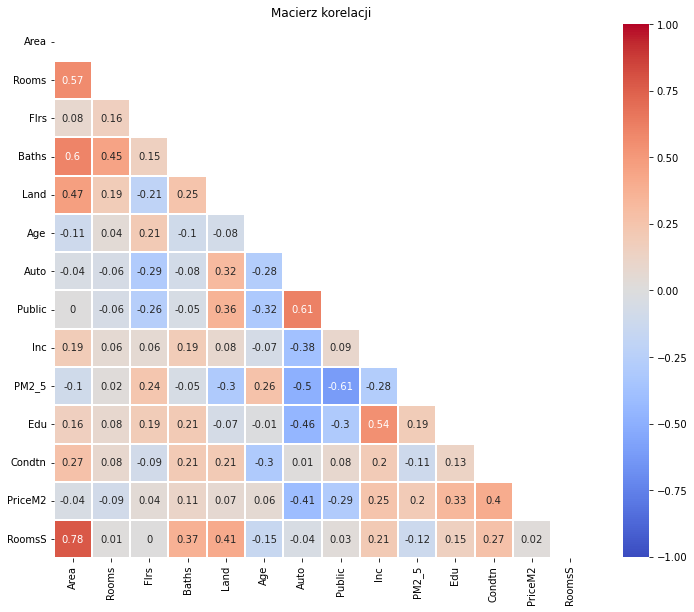

In [29]:
# Mapa korelacji:
corr = REnum.corr()
mask = np.triu(np.ones_like(corr, dtype=np.bool_))

plt.figure(figsize=(12, 14))

htplt = sn.heatmap(np.round(corr, 2),
                   mask=mask,
           cmap='coolwarm', 
           vmax=1.0, vmin=-1.0, 
           linewidths=0.1,
           cbar_kws = {'shrink': .7},
           annot=True,
           annot_kws={'size': 10},
           square=True);

plt.title('Macierz korelacji')

plt.show()

Największa korelacja (>0.5) występuje między zmiennymi: 
- Area oraz RoomsS, 
- Public praz Auto, 
- Inc oraz Edu, 
- PM2_5 oraz Public
- Baths oraz Area

Zobaczmy także, jakie wartości prezentuje statystyka VIF.

In [30]:
X=REnum.drop(['PriceM2'], axis=1)
pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
              index=X.columns)

Area       66.606449
Rooms      52.979062
Flrs        8.233657
Baths      10.966054
Land        3.888699
Age         4.177766
Auto       34.323379
Public     20.219690
Inc        55.377642
PM2_5     130.438035
Edu       282.578979
Condtn      9.678244
RoomsS     65.254697
dtype: float64

Pokazmy statystyki po usunieciu zmiennych najbardziej skorelowanych miedzy soba.

In [31]:
X=X.drop(['Edu','Inc','PM2_5','Auto','Rooms','RoomsS'], axis=1)
pd.Series([variance_inflation_factor(X.values, i) 
               for i in range(X.shape[1])], 
          index=X.columns)

Area      9.131570
Flrs      6.786048
Baths     9.912280
Land      3.673943
Age       3.043375
Public    6.679021
Condtn    7.261312
dtype: float64

Analiza histogramów zmiennych numerycznych pozwoliła zdecydować, które zmienne powinny zostać przekształcone w celu uzyskania rozkładu normalnego.

array([[<AxesSubplot:title={'center':'PriceM2'}>,
        <AxesSubplot:title={'center':'Area'}>,
        <AxesSubplot:title={'center':'Flrs'}>,
        <AxesSubplot:title={'center':'Baths'}>],
       [<AxesSubplot:title={'center':'Land'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'Public'}>,
        <AxesSubplot:title={'center':'Condtn'}>]], dtype=object)

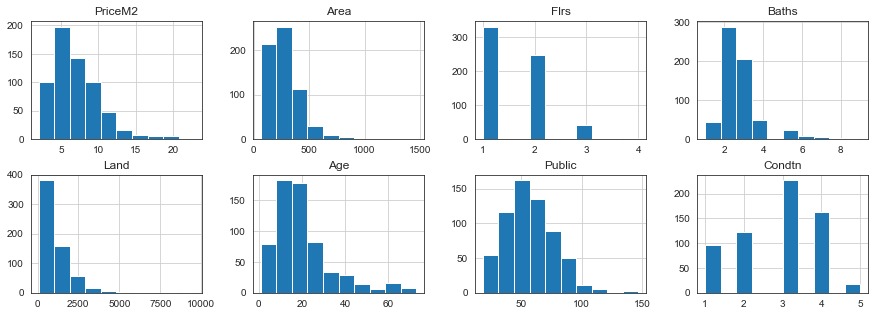

In [32]:
#Wykresy histogramy dla zmiennych liczbowych
realestate4=realestate3[['PriceM2','Area','Flrs','Baths','Land','Age','Public','Condtn','Subbrbs','Price','Rooms']]
sn.set_style("white")
reHist=realestate4.drop(['Price','Rooms'], axis=1)
reHist.hist(figsize=(15,5),layout=(2, 4))

Zlogarytmowaniu zostały poddane zmienne PriceM2, Area oraz Land. 

In [33]:
#Utworzenie zmiennej lnPriceM2
realestate4["lnPriceM2"] = np.log(realestate4["PriceM2"].values)

C:\Users\123\AppData\Local\Temp\ipykernel_8220\2708563245.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  realestate4["lnPriceM2"] = np.log(realestate4["PriceM2"].values)


Test Shapiro wykazał poprawność założenia o rozkładzie logliniowym wymienionych zmiennych przy przyjętym 5% poziomie istotności (PriceM2 oraz Land) lub oraz 1% poziomie dla zmiennej Area. 

In [34]:
#Test Shapairo, H0: zmienna ma rozkład normalny, poziom istotności = 5%
from scipy.stats import shapiro

stat, p = shapiro(realestate4["PriceM2"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")
    
stat, p = shapiro(realestate4["lnPriceM2"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")

stat=0.902, p=0.000
Data does not follow Normal Distribution
stat=0.997, p=0.384
Data follows Normal Distribution


In [35]:
#Utworzenie zmiennej lnArea
realestate4["lnArea"] = np.log(realestate4["Area"].values)

C:\Users\123\AppData\Local\Temp\ipykernel_8220\196569579.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  realestate4["lnArea"] = np.log(realestate4["Area"].values)


In [36]:
#Test Shapairo, H0: zmienna ma rozkład normalny, poziom istotności = 5%
from scipy.stats import shapiro

stat, p = shapiro(realestate4["Area"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")
    

stat, p = shapiro(realestate4["lnArea"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")

stat=0.828, p=0.000
Data does not follow Normal Distribution
stat=0.995, p=0.040
Data does not follow Normal Distribution


In [37]:
#zmienna powierzchnia dzialki Land
realestate4["lnLand"] = np.log(realestate4["Land"].values)

C:\Users\123\AppData\Local\Temp\ipykernel_8220\3471593621.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  realestate4["lnLand"] = np.log(realestate4["Land"].values)


In [38]:
#Test Shapairo, H0: zmienna ma rozkład normalny, poziom istotności = 5%
from scipy.stats import shapiro

stat, p = shapiro(realestate4["Land"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")
    

stat, p = shapiro(realestate4["lnLand"])
print('stat=%.3f, p=%.3f' % (stat, p))
if p > 0.05:
    print("Data follows Normal Distribution")
else:
    print("Data does not follow Normal Distribution")

stat=0.747, p=0.000
Data does not follow Normal Distribution
stat=0.996, p=0.094
Data follows Normal Distribution


Ponadto następujące zmienne zostały zamienione na zmienne binarne: Flrs, Baths, Condtn oraz Subbrbs.

Pomocne przy tym okazało się utworzenie funkcji, która w zależności od zdefiniowanych parametrów rozkodowuje zmienną na zmienne 0-1.

In [39]:
#Zdefiniowanie funkcji DummiesVar do tworzenie zmiennych binarnych
def DummiesVar(dane, var,  Min, Max, typ='e'):
#argumenty: 
#   dane - zbior danych, 
#   var - kolumna/zmienna którą chcemy rozkodowac
#   Min, Max - zdefiniowanie granic przedziału, dla którego tworzymy zmienne binarne
#   typ - określenie relacji zmiennych binarnych
    for i in range(Min, Max+1):
        if typ=='e':
            dane[var+str(i)] = dane[var].apply(lambda x: 1 if x == i else 0)
        elif typ=='m': 
            dane[var+str(i)] = dane[var].apply(lambda x: 1 if x >= i else 0)
        elif typ=='l':
            dane[var+str(i)] = dane[var].apply(lambda x: 1 if x <= i else 0)
        else:
            print('Błędny typ funkcji')


In [40]:
#Poziom bazowy domy parterowe (0,1 pietro)
DummiesVar(dane=realestate4, var='Flrs', Min=1, Max=1, typ='m')
#Poziom bazowy liczba lazienek 1 lub 2
DummiesVar(dane=realestate4, var='Baths', Min=3, Max=5, typ='m')
#zmienna bazowa stan = 1 (do remontu)
DummiesVar(dane=realestate4, var='Condtn', Min=2, Max=5, typ='e')

realestate4.head()

C:\Users\123\AppData\Local\Temp\ipykernel_8220\1903192149.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dane[var+str(i)] = dane[var].apply(lambda x: 1 if x >= i else 0)
C:\Users\123\AppData\Local\Temp\ipykernel_8220\1903192149.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dane[var+str(i)] = dane[var].apply(lambda x: 1 if x >= i else 0)


,PriceM2,Area,Flrs,Baths,Land,Age,Public,Condtn,Subbrbs,Price,...,lnArea,lnLand,Flrs1,Baths3,Baths4,Baths5,Condtn2,Condtn3,Condtn4,Condtn5
ID,,,,,,,,,,,,,,,,,,,,,
1,8.163265,147.0,1,2,580.0,6,35,3,Ząbki,1200.0,...,4.990433,6.363028,1,0,0,0,0,1,0,0
3,9.615385,104.0,1,2,977.0,60,46,2,Ząbki,1000.0,...,4.644391,6.884487,1,0,0,0,1,0,0,0
4,7.784431,167.0,1,2,783.0,10,46,2,Ząbki,1300.0,...,5.117994,6.663133,1,0,0,0,1,0,0,0
5,3.913043,690.0,2,5,1200.0,22,49,3,Ząbki,2700.0,...,6.536692,7.090077,1,1,1,1,0,1,0,0
6,3.669118,136.0,1,1,456.0,50,43,1,Ząbki,499.0,...,4.912655,6.122493,1,0,0,0,0,0,0,0


In [41]:
# Tworzenie zmiennych binarnych dla Powiatów/Dzielnic za pomoca funkcji get_dummies
realestate5 = pd.get_dummies(realestate4, columns=['Subbrbs'])
realestate5.columns

Index(['PriceM2', 'Area', 'Flrs', 'Baths', 'Land', 'Age', 'Public', 'Condtn',
       'Price', 'Rooms', 'lnPriceM2', 'lnArea', 'lnLand', 'Flrs1', 'Baths3',
       'Baths4', 'Baths5', 'Condtn2', 'Condtn3', 'Condtn4', 'Condtn5',
       'Subbrbs_Bemowo', 'Subbrbs_Białołęka', 'Subbrbs_Bielany',
       'Subbrbs_Brwinów', 'Subbrbs_Błonie', 'Subbrbs_Czosnów',
       'Subbrbs_Grodzisk Mazowiecki', 'Subbrbs_Góra Kalwaria',
       'Subbrbs_Halinów', 'Subbrbs_Izabelin', 'Subbrbs_Jabłonna',
       'Subbrbs_Józefów', 'Subbrbs_Kobyłka', 'Subbrbs_Konstancin-Jeziorna',
       'Subbrbs_Legionowo', 'Subbrbs_Lesznowola', 'Subbrbs_Marki',
       'Subbrbs_Michałowice', 'Subbrbs_Milanówek', 'Subbrbs_Mokotów',
       'Subbrbs_Nadarzyn', 'Subbrbs_Nieporęt', 'Subbrbs_Ochota',
       'Subbrbs_Ożarów Mazowiecki', 'Subbrbs_Piaseczno', 'Subbrbs_Piastów',
       'Subbrbs_Podkowa Leśna', 'Subbrbs_Praga-Południe', 'Subbrbs_Pruszków',
       'Subbrbs_Radzymin', 'Subbrbs_Raszyn', 'Subbrbs_Rembertów',
       'Subbrbs_Sta

In [42]:
#Usuwanie zbędnych znaków z nazwach zmiennych
realestate5.rename(columns = lambda x: x.replace(" ",""), inplace = True)
realestate5.rename(columns = lambda x: x.replace("-",""), inplace = True)
    
realestate5.columns

Index(['PriceM2', 'Area', 'Flrs', 'Baths', 'Land', 'Age', 'Public', 'Condtn',
       'Price', 'Rooms', 'lnPriceM2', 'lnArea', 'lnLand', 'Flrs1', 'Baths3',
       'Baths4', 'Baths5', 'Condtn2', 'Condtn3', 'Condtn4', 'Condtn5',
       'Subbrbs_Bemowo', 'Subbrbs_Białołęka', 'Subbrbs_Bielany',
       'Subbrbs_Brwinów', 'Subbrbs_Błonie', 'Subbrbs_Czosnów',
       'Subbrbs_GrodziskMazowiecki', 'Subbrbs_GóraKalwaria', 'Subbrbs_Halinów',
       'Subbrbs_Izabelin', 'Subbrbs_Jabłonna', 'Subbrbs_Józefów',
       'Subbrbs_Kobyłka', 'Subbrbs_KonstancinJeziorna', 'Subbrbs_Legionowo',
       'Subbrbs_Lesznowola', 'Subbrbs_Marki', 'Subbrbs_Michałowice',
       'Subbrbs_Milanówek', 'Subbrbs_Mokotów', 'Subbrbs_Nadarzyn',
       'Subbrbs_Nieporęt', 'Subbrbs_Ochota', 'Subbrbs_OżarówMazowiecki',
       'Subbrbs_Piaseczno', 'Subbrbs_Piastów', 'Subbrbs_PodkowaLeśna',
       'Subbrbs_PragaPołudnie', 'Subbrbs_Pruszków', 'Subbrbs_Radzymin',
       'Subbrbs_Raszyn', 'Subbrbs_Rembertów', 'Subbrbs_StareBabice',
  

In [43]:
# Oszacowanie modelu KMRL
mod = smf.ols(formula = 'lnPriceM2 ~ lnArea + lnLand + Flrs1 + Baths3 + Baths4 + Baths5 + Age + Public + Condtn2 + Condtn3 + Condtn4 + Condtn5 + Subbrbs_Białołęka + Subbrbs_Bielany+ Subbrbs_Brwinów+Subbrbs_Błonie+ Subbrbs_Czosnów+ Subbrbs_GrodziskMazowiecki+Subbrbs_GóraKalwaria+ Subbrbs_Halinów+ Subbrbs_Izabelin+Subbrbs_Jabłonna+ Subbrbs_Józefów+ Subbrbs_Kobyłka+Subbrbs_KonstancinJeziorna+ Subbrbs_Legionowo+Subbrbs_Lesznowola+ Subbrbs_Marki+ Subbrbs_Michałowice+Subbrbs_Milanówek+ Subbrbs_Mokotów+ Subbrbs_Nadarzyn+Subbrbs_Nieporęt+ Subbrbs_Ochota+ Subbrbs_OżarówMazowiecki+Subbrbs_Piaseczno+ Subbrbs_Piastów+ Subbrbs_PodkowaLeśna+Subbrbs_PragaPołudnie+ Subbrbs_Pruszków+ Subbrbs_Radzymin+Subbrbs_Raszyn+ Subbrbs_Rembertów+ Subbrbs_StareBabice+Subbrbs_Sulejówek+ Subbrbs_Targówek+ Subbrbs_Ursynów+Subbrbs_Wawer+ Subbrbs_Wesoła+ Subbrbs_Wieliszew+Subbrbs_Wilanów+ Subbrbs_Wiązowna+ Subbrbs_Wola+Subbrbs_Wołomin+ Subbrbs_Włochy+ Subbrbs_Zielonka+Subbrbs_Ząbki+ Subbrbs_Łomianki+ Subbrbs_Żoliborz', 
              data = realestate5)
res = mod.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              lnPriceM2   R-squared:                       0.709
Model:                            OLS   Adj. R-squared:                  0.679
Method:                 Least Squares   F-statistic:                     23.84
Date:                Sat, 26 Feb 2022   Prob (F-statistic):          3.70e-117
Time:                        19:04:29   Log-Likelihood:                 17.623
No. Observations:                 626   AIC:                             82.75
Df Residuals:                     567   BIC:                             344.7
Df Model:                          58                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      1.8950      0.099     19.203      0.000       1.701       2.089
lnArea                        -0.5738      0.032    -18.053      0.000      -0.636      -0.511
lnLand                         0.2134      0.018     11.552      0.000       0.177       0.250
Flrs1                          1.8950      0.099     19.203      0.000       1.701       2.089
Baths3                         0.0312      0.025      1.260      0.208      -0.017       0.080
Baths4                         0.0183      0.042      0.437      0.662      -0.064       0.100
Baths5                         0.1647      0.055      3.012      0.003       0.057       0.272
Age                           -0.0031      0.001     -3.375      0.001      -0.005      -0.001
Public                        -0.0036      0.001     -3.626      0.000      -0.005      -0.002
Condtn2                        0.1138      0.036      3.150      0.002       0.043       0.185
Condtn3                        0.2429      0.033      7.435      0.000       0.179       0.307
Condtn4                        0.4382      0.036     12.217      0.000       0.368       0.509
Condtn5                        0.8418      0.070     12.105      0.000       0.705       0.978
Subbrbs_Białołęka             -0.2637      0.120     -2.195      0.029      -0.500      -0.028
Subbrbs_Bielany                0.1359      0.139      0.977      0.329      -0.137       0.409
Subbrbs_Brwinów               -0.5223      0.126     -4.142      0.000      -0.770      -0.275
Subbrbs_Błonie                -0.7053      0.183     -3.851      0.000      -1.065      -0.346
Subbrbs_Czosnów               -0.5343      0.164     -3.263      0.001      -0.856      -0.213
Subbrbs_GrodziskMazowiecki    -0.5163      0.135     -3.830      0.000      -0.781      -0.252
Subbrbs_GóraKalwaria          -0.3545      0.154     -2.306      0.021      -0.657      -0.053
Subbrbs_Halinów               -0.6020      0.142     -4.252      0.000      -0.880      -0.324
Subbrbs_Izabelin               0.0291      0.149      0.194      0.846      -0.265       0.323
Subbrbs_Jabłonna              -0.4945      0.145     -3.413      0.001      -0.779      -0.210
Subbrbs_Józefów               -0.2885      0.130     -2.219      0.027      -0.544      -0.033
Subbrbs_Kobyłka               -0.6042      0.152     -3.985      0.000      -0.902      -0.306
Subbrbs_KonstancinJeziorna    -0.0351      0.123     -0.286      0.775      -0.276       0.206
Subbrbs_Legionowo             -0.4812      0.168     -2.868      0.004      -0.811      -0.152
Subbrbs_Lesznowola            -0.4265      0.130     -3.282      0.001      -0.682      -0.171
Subbrbs_Marki                 -0.4432      0.125     -3.556      0.000      -0.688      -0.198
Subbrbs_Michałowice           -0.3216      

C:\Users\123\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


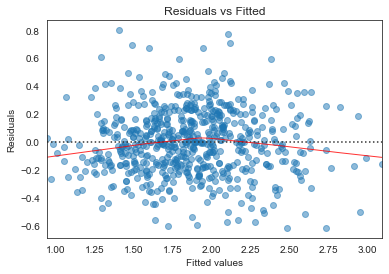

In [44]:
model_fitted_y = res.fittedvalues
# model residuals
model_residuals = res.resid
# normalized residuals
model_norm_residuals = res.get_influence().resid_studentized_internal
# absolute squared normalized residuals
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
# absolute residuals
model_abs_resid = np.abs(model_residuals)
# leverage, from statsmodels internals
model_leverage = res.get_influence().hat_matrix_diag
# cook's distance, from statsmodels internals
model_cooks = res.get_influence().cooks_distance[0]

plot_lm_1 = plt.figure()
plot_lm_1.axes[0] = sn.residplot(model_fitted_y, model_residuals, data=realestate5,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot_lm_1.axes[0].set_title('Residuals vs Fitted')
plot_lm_1.axes[0].set_xlabel('Fitted values')
plot_lm_1.axes[0].set_ylabel('Residuals');

C:\Users\123\anaconda3\envs\geo_env\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


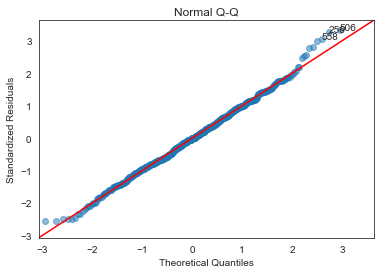

In [45]:
QQ = ProbPlot(model_norm_residuals)
plot_lm_2 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)
plot_lm_2.axes[0].set_title('Normal Q-Q')
plot_lm_2.axes[0].set_xlabel('Theoretical Quantiles')
plot_lm_2.axes[0].set_ylabel('Standardized Residuals');
# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot_lm_2.axes[0].annotate(i,
                               xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));

In [46]:
#Testowanie czy reszty przyjmuja rozkład normalny.
statistic, p_value = shapiro(model_residuals)
if p_value>0.05:
    print("Distribution is normal. Statistic: {0:.3}, p-value: {1:.4}".format(statistic, p_value))
else:
    print("Distribution is not normal. Statistic: {0:.3}, p-value: {1:.4}".format(statistic, p_value))

Distribution is normal. Statistic: 0.996, p-value: 0.1423


In [47]:
#Oszacowanie modelu
#Bez zmiennych nieistotnych
mod = smf.ols(formula = 'lnPriceM2 ~ lnArea + lnLand + Age + Public + Condtn2 + Condtn3 + Condtn4 + Condtn5 + Subbrbs_Białołęka+ Subbrbs_Brwinów+Subbrbs_Błonie+ Subbrbs_Czosnów+ Subbrbs_GrodziskMazowiecki+Subbrbs_GóraKalwaria+ Subbrbs_Halinów+Subbrbs_Jabłonna+ Subbrbs_Józefów+ Subbrbs_Kobyłka+ Subbrbs_Legionowo+Subbrbs_Lesznowola+ Subbrbs_Marki+ Subbrbs_Michałowice+ Subbrbs_Mokotów+ Subbrbs_Nadarzyn+Subbrbs_Nieporęt+ Subbrbs_Ochota+Subbrbs_Piaseczno+ Subbrbs_Piastów+ Subbrbs_PodkowaLeśna+Subbrbs_PragaPołudnie+ Subbrbs_Pruszków+ Subbrbs_Radzymin+Subbrbs_Raszyn+ Subbrbs_StareBabice+Subbrbs_Sulejówek+ Subbrbs_Wesoła+ Subbrbs_Wieliszew+Subbrbs_Wilanów+ Subbrbs_Wiązowna+Subbrbs_Wołomin+ Subbrbs_Zielonka+Subbrbs_Ząbki+ Subbrbs_Żoliborz', 
              data = realestate5)
res = mod.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              lnPriceM2   R-squared:                       0.677
Model:                            OLS   Adj. R-squared:                  0.653
Method:                 Least Squares   F-statistic:                     28.41
Date:                Sat, 26 Feb 2022   Prob (F-statistic):          2.51e-115
Time:                        19:04:30   Log-Likelihood:                -14.944
No. Observations:                 626   AIC:                             117.9
Df Residuals:                     582   BIC:                             313.2
Df Model:                          43                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
Intercept                      3.5368      0.151     23.464      0.000       3.241       3.833
lnArea                        -0.5085      0.029    -17.557      0.000      -0.565      -0.452
lnLand                         0.1925      0.018     10.589      0.000       0.157       0.228
Age                           -0.0034      0.001     -3.699      0.000      -0.005      -0.002
Public                        -0.0033      0.001     -3.757      0.000      -0.005      -0.002
Condtn2                        0.1211      0.037      3.266      0.001       0.048       0.194
Condtn3                        0.2542      0.034      7.582      0.000       0.188       0.320
Condtn4                        0.4460      0.037     12.117      0.000       0.374       0.518
Condtn5                        0.8425      0.071     11.874      0.000       0.703       0.982
Subbrbs_Białołęka             -0.2320      0.048     -4.798      0.000      -0.327      -0.137
Subbrbs_Brwinów               -0.4796      0.061     -7.837      0.000      -0.600      -0.359
Subbrbs_Błonie                -0.6688      0.151     -4.431      0.000      -0.965      -0.372
Subbrbs_Czosnów               -0.4890      0.121     -4.048      0.000      -0.726      -0.252
Subbrbs_GrodziskMazowiecki    -0.4618      0.074     -6.255      0.000      -0.607      -0.317
Subbrbs_GóraKalwaria          -0.3153      0.105     -2.999      0.003      -0.522      -0.109
Subbrbs_Halinów               -0.5625      0.092     -6.139      0.000      -0.742      -0.383
Subbrbs_Jabłonna              -0.4438      0.095     -4.676      0.000      -0.630      -0.257
Subbrbs_Józefów               -0.2422      0.071     -3.431      0.001      -0.381      -0.104
Subbrbs_Kobyłka               -0.5259      0.108     -4.881      0.000      -0.738      -0.314
Subbrbs_Legionowo             -0.4381      0.132     -3.320      0.001      -0.697      -0.179
Subbrbs_Lesznowola            -0.3725      0.067     -5.594      0.000      -0.503      -0.242
Subbrbs_Marki                 -0.4139      0.060     -6.876      0.000      -0.532      -0.296
Subbrbs_Michałowice           -0.2825      0.068     -4.155      0.000      -0.416      -0.149
Subbrbs_Mokotów                0.5874      0.053     11.016      0.000       0.483       0.692
Subbrbs_Nadarzyn              -0.3372      0.075     -4.499      0.000      -0.484      -0.190
Subbrbs_Nieporęt              -0.3851      0.118     -3.261      0.001      -0.617      -0.153
Subbrbs_Ochota                 0.3483      0.119      2.915      0.004       0.114       0.583
Subbrbs_Piaseczno             -0.2548      0.047     -5.467      0.000      -0.346      -0.163
Subbrbs_Piastów               -0.3575      0.132     -2.705      0.007      -0.617      -0.098
Subbrbs_PodkowaLeśna          -0.2741      

C:\Users\123\anaconda3\envs\geo_env\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


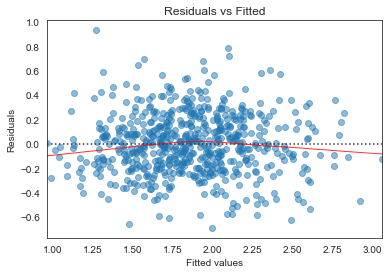

In [48]:
model_fitted_y = res.fittedvalues
# model residuals
model_residuals = res.resid
# normalized residuals
model_norm_residuals = res.get_influence().resid_studentized_internal
# absolute squared normalized residuals
model_norm_residuals_abs_sqrt = np.sqrt(np.abs(model_norm_residuals))
# absolute residuals
model_abs_resid = np.abs(model_residuals)
# leverage, from statsmodels internals
model_leverage = res.get_influence().hat_matrix_diag
# cook's distance, from statsmodels internals
model_cooks = res.get_influence().cooks_distance[0]

plot_lm_1 = plt.figure()
plot_lm_1.axes[0] = sn.residplot(model_fitted_y, model_residuals, data=realestate5,
                          lowess=True,
                          scatter_kws={'alpha': 0.5},
                          line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8})

plot_lm_1.axes[0].set_title('Residuals vs Fitted')
plot_lm_1.axes[0].set_xlabel('Fitted values')
plot_lm_1.axes[0].set_ylabel('Residuals');

C:\Users\123\anaconda3\envs\geo_env\lib\site-packages\statsmodels\graphics\gofplots.py:1045: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b" (-> color=(0.0, 0.0, 1.0, 1)). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


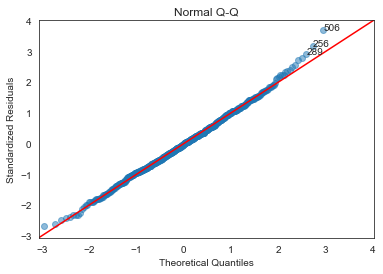

In [49]:
QQ = ProbPlot(model_norm_residuals)
plot_lm_2 = QQ.qqplot(line='45', alpha=0.5, color='#4C72B0', lw=1)
plot_lm_2.axes[0].set_title('Normal Q-Q')
plot_lm_2.axes[0].set_xlabel('Theoretical Quantiles')
plot_lm_2.axes[0].set_ylabel('Standardized Residuals');
# annotations
abs_norm_resid = np.flip(np.argsort(np.abs(model_norm_residuals)), 0)
abs_norm_resid_top_3 = abs_norm_resid[:3]
for r, i in enumerate(abs_norm_resid_top_3):
    plot_lm_2.axes[0].annotate(i,
                               xy=(np.flip(QQ.theoretical_quantiles, 0)[r],
                                   model_norm_residuals[i]));

In [50]:
#Testowanie czy reszty przyjmuja rozkład normalny.
statistic, p_value = shapiro(model_residuals)
if p_value>0.05:
    print("Distribution is normal. Statistic: {0:.3}, p-value: {1:.4}".format(statistic, p_value))
else:
    print("Distribution is not normal. Statistic: {0:.3}, p-value: {1:.4}".format(statistic, p_value))

Distribution is normal. Statistic: 0.997, p-value: 0.324


Poniżej utworzona zostanie prosta wizualizacja przestrzenna średniej ceny m2 oraz ceny nieruchomości dla analizowanych rejonów aglomeracji warszawskiej.

In [51]:
#wczytanie pliku z granicami rejonów aglomeracji warszawskiej, które będziemy rysować na wykresie-mapie
subbrbs_shapefile = gpd.read_file("WybraneGranice3/gminodzielnice.shp", encoding='cp1250')
subbrbs_shapefile.head()

,jpt_nazwa_,jpt_kod_je,iip_przest,iip_identy,jpt_sjr_ko,jpt_nazw01,jpt_organ_,jpt_orga01,jpt_jor_id,wazny_do,...,jpt_opis,jpt_sps_ko,gra_ids,status_obi,opis_bledu,typ_bledu,wersja_od,wazny_od,iip_wersja,geometry
0,Żoliborz,1465198,None,None,None,None,None,None,NaN,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((20.95755 52.26693, 20.95760 52.26712..."
1,Praga-Południe,1465078,None,None,None,None,None,None,NaN,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((21.10347 52.22220, 21.10326 52.22206..."
2,Mokotów,1465058,None,None,None,None,None,None,NaN,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((21.02160 52.21305, 21.02172 52.21307..."
3,Wola,1465188,None,None,None,None,None,None,NaN,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((20.98121 52.25855, 20.98124 52.25838..."
4,Wilanów,1465168,None,None,None,None,None,None,NaN,None,...,None,None,None,None,None,None,None,None,None,"POLYGON ((21.10500 52.19428, 21.10509 52.19404..."


In [52]:
#wczytanie pliku przyporządkującego kody rejonów oraz ich nazwy używane w analizowanej bazie danych (kolumna Subbrbs)
units_mappng = pd.read_csv('units_mapping.csv', header = 0, sep = ';', encoding='cp1250')
# wymiary tabeli
print(units_mappng.shape)
# początek tabeli
units_mappng.head()

(52, 2)


,Subbrbs,jpt_kod_je
0,Ząbki,1434031
1,Marki,1434021
2,Kobyłka,1434011
3,Zielonka,1434041
4,Wołomin,1434123


In [53]:
# Zamiana formatu liczbowego na teksowy, dtype=object; 
# usunięcie newlines - pustych wierszy
units_mappng['jpt_kod_je'] = units_mappng.jpt_kod_je.apply(lambda x: str(x).replace('\n',''))

In [54]:
# sprawdzenie, ile kodow zostało połączonych z analizowanymi rejonami
realestate4.merge(units_mappng, how='left', on="Subbrbs")['jpt_kod_je'].unique().size

48

In [55]:
# dodanie kolumny z identyfikatorem rejonu
realestate4 = realestate4.merge(units_mappng, how='left', on="Subbrbs")
realestate4.head()

,PriceM2,Area,Flrs,Baths,Land,Age,Public,Condtn,Subbrbs,Price,...,lnLand,Flrs1,Baths3,Baths4,Baths5,Condtn2,Condtn3,Condtn4,Condtn5,jpt_kod_je
0,8.163265,147.0,1,2,580.0,6,35,3,Ząbki,1200.0,...,6.363028,1,0,0,0,0,1,0,0,1434031
1,9.615385,104.0,1,2,977.0,60,46,2,Ząbki,1000.0,...,6.884487,1,0,0,0,1,0,0,0,1434031
2,7.784431,167.0,1,2,783.0,10,46,2,Ząbki,1300.0,...,6.663133,1,0,0,0,1,0,0,0,1434031
3,3.913043,690.0,2,5,1200.0,22,49,3,Ząbki,2700.0,...,7.090077,1,1,1,1,0,1,0,0,1434031
4,3.669118,136.0,1,1,456.0,50,43,1,Ząbki,499.0,...,6.122493,1,0,0,0,0,0,0,0,1434031


In [56]:
# sprawdzenie, czy istnieja wiersze bez indentyfikatora
realestate4.loc[realestate4.jpt_kod_je.isna()]

,PriceM2,Area,Flrs,Baths,Land,Age,Public,Condtn,Subbrbs,Price,...,lnLand,Flrs1,Baths3,Baths4,Baths5,Condtn2,Condtn3,Condtn4,Condtn5,jpt_kod_je


In [57]:
# tabela kalkulujące średnioą cenę m2 dla poszczególnych dzielnic/gmin
restt_agg = realestate4.groupby(['jpt_kod_je']).agg({'PriceM2':'mean', 'Price': 'mean'}).round(2)
# uzupełnienie tabeli o brakujące rejony, nie uwzględnione w analizie, dla pełniejszej prezentacji graficznej
resttextn_agg = units_mappng.merge(restt_agg, how='left', on="jpt_kod_je")

In [58]:
# wyświetlenie dodanych rejonów
resttextn_agg.loc[resttextn_agg.Price.isna()]

,Subbrbs,jpt_kod_je,PriceM2,Price
16,Nowy Dwór Mazowiecki,1414011,NaN,NaN
49,Śródmieście,1465108,NaN,NaN
50,Praga-Północ,1465088,NaN,NaN
51,Ursus,1465128,NaN,NaN


In [59]:
# utworzenie identyfikatora, czy dany rejon znajdował się w bazie danych
resttextn_agg["MissingInd"] = resttextn_agg.Price.apply(lambda x: 'brak danych' if np.isnan(x) else 'analizowany rejon')
# zamiana "braków" na 0, zeby wyswietlaly sie na mapie 
resttextn_agg.fillna(0, inplace=True)

In [60]:
# zamiana tabeli na słownik danych przekazanych do wykresu
# Returns a GeoDataFrame as a python feature collection.
subbrbs_geojson = subbrbs_shapefile.__geo_interface__

In [61]:
subbrbs_geojson

{'type': 'FeatureCollection',
 'features': [{'id': '0',
   'type': 'Feature',
   'properties': {'gra_ids': None,
    'id_bufor01': None,
    'id_bufora_': None,
    'id_technic': None,
    'iip_identy': None,
    'iip_przest': None,
    'iip_wersja': None,
    'jpt_jor_id': None,
    'jpt_kj_i01': None,
    'jpt_kj_i02': None,
    'jpt_kj_iip': None,
    'jpt_kod_01': None,
    'jpt_kod_je': '1465198',
    'jpt_nazw01': None,
    'jpt_nazwa_': 'Żoliborz',
    'jpt_opis': None,
    'jpt_orga01': None,
    'jpt_organ_': None,
    'jpt_powier': None,
    'jpt_sjr_ko': None,
    'jpt_sps_ko': None,
    'jpt_wazna_': None,
    'opis_bledu': None,
    'status_obi': None,
    'typ_bledu': None,
    'wazny_do': None,
    'wazny_od': None,
    'wersja_do': None,
    'wersja_od': None},
   'geometry': {'type': 'Polygon',
    'coordinates': (((20.957550244361183, 52.26692797209729),
      (20.95759503328158, 52.267120683309685),
      (20.957577637117186, 52.267236078426386),
      (20.9575373122

In [62]:
# https://plotly.github.io/plotly.py-docs/generated/plotly.express.choropleth.html
  
fig = px.choropleth(data_frame=resttextn_agg, geojson=subbrbs_geojson,
                    locations='jpt_kod_je', # z df
                    featureidkey="properties.jpt_kod_je", # z geo slownika
                    color='PriceM2',
                    color_continuous_scale="Viridis",
                    fitbounds='locations',
                    #range_color=(0, 12),
                    hover_name="Subbrbs",
                    hover_data=["PriceM2","Price","MissingInd"],
                    labels={"PriceM2":"Price/m<sup>2</sup>"}
                          )

In [63]:
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":0},
                   title='Cena M<sup>2</sup> dla poszczególnych rejonów aglomeracji warszawskiej',
                 ) # margines minimalny - zwieksza rozmiar rysunku
fig.update_geos(
    fitbounds="geojson",
#     resolution=50,
    visible=False,
    showframe=False,
    projection_type= "mercator"
    #projection={"type": "mercator"}
)
fig.show()

Wykresy punktowe są prostym narzędziem zaprezentowania zależności pomiędzy poszczególnymi charakterystykami a ceną m2. 

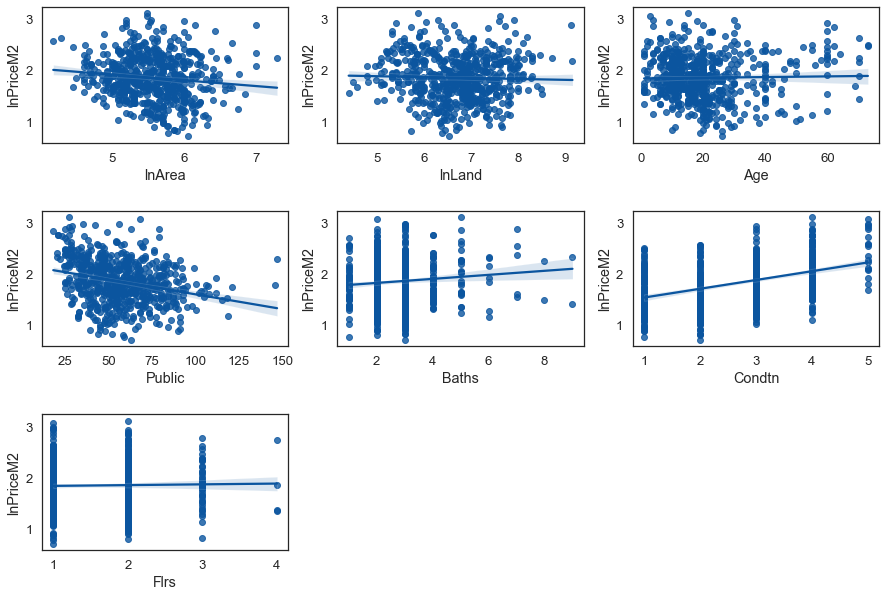

In [64]:
#Utworzenie wykresów punktowych, w celu okazania zależności liniowej między zmiennymi a cena m2
sn.set(font_scale = 1.2)
sn.set_style("white")
sn.set_palette("Blues_r")
plt.figure(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
varList=['lnArea','lnLand','Age','Public','Baths','Condtn','Flrs']
i=1
for feature in varList:
    plt.subplot(3,3,i)
    sn.regplot(data=realestate5, x=feature,y='lnPriceM2')
    i = i +1

Poniżej przygotowane zostaną tabele grupujące, filtrujące oraz sortujące dane. Ponizsza analiza pozwoli na przygotowania najwazniejszych podsumowań oraz rankingów.

In [65]:
#Utworzenie słownika opisującego zmienna Condtn
Stan=pd.DataFrame([{1.0:"do remontu", 2.0:'dobry', 3.0:"bardzo dobry", 4.0:'wysoki', 5.0:'luksusowy'}]).T
Stan.columns=['Standard']
display(Stan)
realestate5=pd.merge(realestate4,Stan, left_on="Condtn", right_index=True, how="left")

,Standard
1.0,do remontu
2.0,dobry
3.0,bardzo dobry
4.0,wysoki
5.0,luksusowy


In [66]:
#Zdefiniowanie przedziałów powierzchni nieruchomości oraz zgrupowaie danych wg utworzonego podziału
bins = pd.IntervalIndex.from_tuples([(0, 300), (300, 600), (600, 900), (900, 1200), (1200, 1500)])
b=realestate5.groupby([pd.cut(realestate5['Area'], bins),"Condtn",'Standard'])

#najważniejsze informacje w podziale na poszczególne przedziały oraz poziom wykończenia
b=b.agg({'Price':'median','PriceM2':'median','Area':'mean'}).round(2)
b.columns =['Price','PriceM2','Area Avg']
b=b.dropna()
b

Price  PriceM2  Area Avg
Area         Condtn Standard                                
(0, 300]     1      do remontu      892.5     5.14    188.75
             2      dobry           990.0     5.59    205.87
             3      bardzo dobry   1300.0     6.74    210.72
             4      wysoki         1800.0     8.44    219.09
             5      luksusowy      3390.0    18.83    224.40
(300, 600]   1      do remontu     1410.0     4.09    373.70
             2      dobry          1650.0     4.29    389.85
             3      bardzo dobry   1990.0     5.53    405.78
             4      wysoki         2885.0     7.81    411.74
             5      luksusowy      4400.0    10.64    389.57
(600, 900]   1      do remontu     3850.0     6.31    610.00
             3      bardzo dobry   4475.0     6.48    727.50
             4      wysoki         4300.0     6.09    706.00
             5      luksusowy      4970.0     6.53    751.58
(900, 1200]  3      bardzo dobry   4400.0     4.71    935.00
             4      wysoki        10200.0     9.28   1099.00
             5      luksusowy     19500.0    17.96   1086.00
(1200, 1500] 5      luksusowy     13900.0     9.49   1465.00

In [67]:
#alternatywnie zaprezentowana średnia cena m2 w podziale na przedziały powierzchni oraz stan wykończenia
bb=b.reset_index(drop = False, inplace = False)
pvRE1=pd.pivot_table(bb,index='Area', columns=['Condtn','Standard'], values=['PriceM2'], aggfunc=np.mean, margins = True)
pvRE1.style.format('{:.2f}', na_rep="-")

In [68]:
#Top 10
# najczęściej oferowane nieruchomości na rynku - według ilości pokoi oraz stanu wykończenia
IdealHouse = realestate4.groupby(["Rooms","Condtn"])
IdealHouse.size().nlargest(10)
a=IdealHouse.agg({'Price':'count','PriceM2':'median','Area':'mean','Land':'mean','Age':'mean'})
a.columns =['No','PriceM2','Area','Land','Age']
a.round(2).sort_values(by='No',ascending=False)[:10]

No  PriceM2    Area     Land    Age
Rooms Condtn                                     
5     3       59     6.47  223.84  1148.29  16.20
6     3       56     6.58  278.85   986.75  20.23
5     4       48     8.30  242.28   859.23  15.17
6     4       47     8.22  310.30  1170.62  12.47
      2       36     5.04  286.68  1022.32  25.33
7     3       32     5.56  303.25  1101.44  19.28
5     2       29     5.67  201.89   838.03  21.10
      1       28     4.87  181.42   823.46  27.89
8     3       27     6.66  355.73  1125.74  19.96
4     3       24     6.83  175.60   893.88  24.21

In [69]:
#Top 10
#najtansze dzielnice dla najpopularniejszych nieruchomosci
Sub = realestate4[(realestate4['Rooms']==6)&(realestate4['Condtn']==3)].groupby(["Subbrbs"])
a=Sub.agg({'PriceM2':'median','Price':'median'})
a.columns =['PriceM2','Price']
a.round(2).sort_values(by='PriceM2',ascending=True)[:10]


,PriceM2,Price
Subbrbs,,
Radzymin,3.13,883.5
Pruszków,3.57,999.0
Grodzisk Mazowiecki,3.88,1685.0
Nadarzyn,4.01,1600.0
Piastów,4.05,1150.0
Zielonka,4.82,889.0
Stare Babice,5.00,1350.0
Wesoła,5.15,1750.0
Ożarów Mazowiecki,5.34,1990.0


In [70]:
#Top 10
#ktore dzielnice maja najkrotszy dojazd publiczny
Sub = realestate4.groupby(["Subbrbs"])
a=Sub.agg({'Public':'median','PriceM2':'median','Price':'count'})
a.columns =['Public','PriceM2','No. offerts']
a.round(2).sort_values(by='Public',ascending=True)[:10]


,Public,PriceM2,No. offerts
Subbrbs,,,
Ochota,23.0,11.21,5
Praga-Południe,25.0,10.89,9
Wola,25.5,9.47,2
Żoliborz,26.5,15.07,8
Mokotów,33.0,10.97,36
Targówek,37.0,5.93,14
Piastów,37.0,5.81,4
Zielonka,39.0,4.38,12
Włochy,39.0,7.96,8


In [71]:
#Top 10
#najdrozsze dzielnice
Sub = realestate4.groupby(["Subbrbs"])
a=Sub.agg({'PriceM2':'median','Area':'median','Age':'count'})
a.columns =['PriceM2','Area','No. offerts']
a.round(2).sort_values(by='PriceM2',ascending=False)[:10]


,PriceM2,Area,No. offerts
Subbrbs,,,
Żoliborz,15.07,282.5,8
Ochota,11.21,240.0,5
Mokotów,10.97,245.5,36
Praga-Południe,10.89,220.0,9
Izabelin,10.36,275.0,7
Wilanów,9.68,330.0,27
Wola,9.47,190.0,2
Bielany,9.17,270.0,9
Konstancin-Jeziorna,8.68,380.0,45


In [72]:
#Top 10
#najtansze dzielnice
Sub = realestate4.groupby(["Subbrbs"])
a=Sub.agg({'PriceM2':'median','Area':'median','Age':'count'})
a.columns =['PriceM2','Area','No. offerts']
a.round(2).sort_values(by='PriceM2',ascending=True)[:10]

,PriceM2,Area,No. offerts
Subbrbs,,,
Sulejówek,3.49,298.0,6
Radzymin,3.52,282.0,6
Błonie,3.92,191.1,3
Wołomin,4.15,289.0,5
Zielonka,4.38,192.5,12
Kobyłka,4.63,246.6,6
Grodzisk Mazowiecki,4.67,198.0,17
Legionowo,4.76,134.2,4
Wieliszew,4.81,162.0,5


In [73]:
#zróżnicowanie nieruchomości ze względu na stan wykończenia
Cond = realestate5.groupby(["Condtn",'Standard'])
a=Cond.agg({'PriceM2':'median','Area':'median','Age':'count','Price':lambda x: x.count()/len(realestate5)*100})
a.columns =['PriceM2','Area','No. offerts','%offers']
a.sort_values(by='PriceM2',ascending=False).round(2)

,,PriceM2,Area,No. offerts,%offers
Condtn,Standard,,,,
5,luksusowy,11.69,385.0,18,2.88
4,wysoki,8.15,280.0,163,26.04
3,bardzo dobry,6.42,256.0,227,36.26
2,dobry,5.19,262.0,122,19.49
1,do remontu,4.94,200.0,96,15.34


In [74]:
#cena m2 dla poszczególnych rejonów w podziale na standard wykończenia 
pvRE1=pd.pivot_table(realestate5,index='Subbrbs', columns=['Condtn','Standard'], values=['PriceM2'], aggfunc=np.mean, margins = True)
pvRE1.style.format('{:.2f}', na_rep="-")

Na koniec przygotowany zostanie  bubble chart z bibliotek plotly. Każdy punkt będzie reprezentował poszczególny rejon, jego wielkość będzie zależna od ilości dostępnych ofert. Na osiach zostanie przedstawiona zależność między czasem dojazdu a ceną m2. Widoczny będzie także podział punktów w zależności od standardu wykończenia. 

In [75]:
#Utworzenie tabeli zawierającej informacje niezbędne do przygotowania wykresu babelkowego
reBB = realestate5.groupby(["Subbrbs",'Condtn','Standard'])
reBB=reBB.agg({'PriceM2':'median','Price':'median','Area':'mean','Public':'mean', 'Age': 'count'})
reBB.columns =['PriceM2','Price','Area','Public','No']
reBB.head()

PriceM2   Price        Area     Public  No
Subbrbs   Condtn Standard                                                 
Bemowo    1      do remontu    5.625000  1350.0  240.000000  45.000000   1
          2      dobry         4.937500  1975.0  400.000000  37.000000   2
          3      bardzo dobry  7.156527  1434.5  202.000000  37.500000   2
Białołęka 1      do remontu    3.918852   877.0  210.263333  48.666667   3
          2      dobry         4.701258  1400.0  264.545455  57.000000  11

In [76]:
#Usunięcie multiindeksu
reBB = reBB.sort_values(['Standard', 'Subbrbs'])
reBB=reBB.reset_index(drop = False, inplace = False)
reBB.head()

,Subbrbs,Condtn,Standard,PriceM2,Price,Area,Public,No
0,Bemowo,3,bardzo dobry,7.156527,1434.5,202.000000,37.500000,2
1,Białołęka,3,bardzo dobry,6.955019,1495.0,236.087059,55.411765,17
2,Bielany,3,bardzo dobry,8.596491,2450.0,314.200000,41.000000,5
3,Brwinów,3,bardzo dobry,5.499048,929.8,214.314286,56.714286,7
4,Błonie,3,bardzo dobry,6.103570,999.5,170.950000,65.500000,2


In [77]:
# Stworzenie list zawierających informacje opisujące każdy punkt oraz jego rozmiar
hover_text = []
bubble_size = []

for index, row in reBB.iterrows():
    hover_text.append(('Standard: {standard}<br>'+
                      'Cena M2: {priceM2:0.3f}<br>'+
                      'Odleglosc: {public:0.2f}<br>'+
                        'Dzialnica: {subbrbs}<br>'+
                      'Liczba ofert: {no}<br>').format(standard=row['Standard'],
                                            priceM2=row['PriceM2'],
                                            public=row['Public'],
                                            subbrbs=row['Subbrbs'],
                                            no=row['No']))
    bubble_size.append(math.sqrt(row['No']))

reBB['text'] = hover_text
reBB['size'] = bubble_size

sizeref = 2.*max(reBB['size'])/(30**2)
reBB.head()


,Subbrbs,Condtn,Standard,PriceM2,Price,Area,Public,No,text,size
0,Bemowo,3,bardzo dobry,7.156527,1434.5,202.000000,37.500000,2,Standard: bardzo dobry<br>Cena M2: 7.157<br>Od...,1.414214
1,Białołęka,3,bardzo dobry,6.955019,1495.0,236.087059,55.411765,17,Standard: bardzo dobry<br>Cena M2: 6.955<br>Od...,4.123106
2,Bielany,3,bardzo dobry,8.596491,2450.0,314.200000,41.000000,5,Standard: bardzo dobry<br>Cena M2: 8.596<br>Od...,2.236068
3,Brwinów,3,bardzo dobry,5.499048,929.8,214.314286,56.714286,7,Standard: bardzo dobry<br>Cena M2: 5.499<br>Od...,2.645751
4,Błonie,3,bardzo dobry,6.103570,999.5,170.950000,65.500000,2,Standard: bardzo dobry<br>Cena M2: 6.104<br>Od...,1.414214


In [78]:
# Lista zawierająca słownik stanu budynku
standard_names = ['do remontu', 'dobry', 'bardzo dobry', 'wysoki', 'luksusowy']
standard_data = {standard:reBB.query("Standard == '%s'" %standard)
                              for standard in standard_names}

In [79]:
#Utworzenie wykresu bubble chart
# Create figure
#https://plotly.com/python/bubble-charts/
fig = go.Figure()

for standard_name, standard in standard_data.items():
    fig.add_trace(go.Scatter(
        x=standard['Public'], y=standard['PriceM2'],
        name=standard_name, text=standard['text'],
        marker_size=standard['size']
        ))

# Tune marker appearance and layout
fig.update_traces(mode='markers', marker=dict(sizemode='area',
                                              sizeref=sizeref, line_width=2))

fig.update_layout(
    title='Cena M<sup>2</sup> v. czas dojazdu',
    xaxis=dict(
        title='Czas dojazdu do centrum (min)',
        gridcolor='white',
        gridwidth=2,
    ),
    yaxis=dict(
        title='Cena M<sup>2</sup> (kPLN)',
        gridcolor='white',
        gridwidth=2,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',

)
fig.update_layout(legend= {'itemsizing': 'constant', 'title': 'Standard'})
fig.show()